# RESTAURACION DE DOCUMENTOS ESCANEADOS

In [ ]:
import cv2
import pandas as pd
import tarfile
from tqdm.notebook import tqdm
import os
import matplotlib.pyplot as plt
import numpy as np
from shutil import copyfile
import re
import glob

## Preparacion de los datos

Para este desafio se usaran documentos escaneados provenientes de varias sentencias de la orden constitucional

In [ ]:
test = cv2.imread(cv2.samples.findFile("drive/MyDrive/DIPLOMADO INTELIGENCIA ARTIFICIAL/TAREAS/9. RETOS/2. Restauracion de documentos/DATA/ORIGINAL_IMAGES/C-415-20_00001.jpg"))

In [ ]:
test.shape

(2800, 1700, 3)

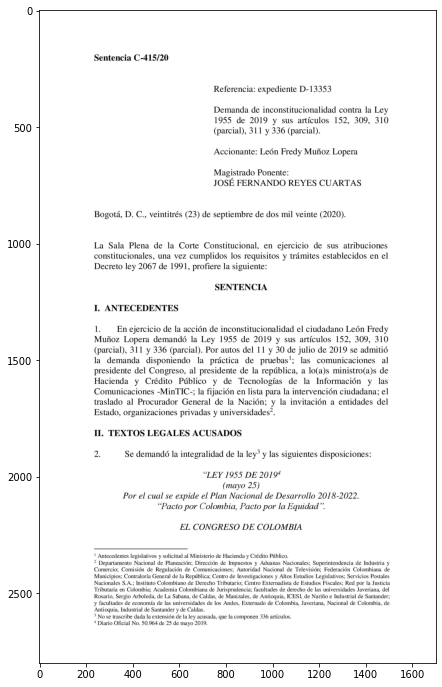

In [ ]:
plt.figure(figsize=(15,12))
plt.imshow(test[:,:,0], cmap='gray')

Los documentos seran divididos en fragmentos de 100 px x 100 px, con el objetivo de que con estas imagenes sea entrenado el autoencoder.

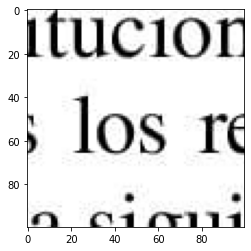

In [ ]:
x = 800
y = 1000

plt.imshow(test[y:y+100,x:x+100])

In [ ]:
tesst = test[y:y+100,x:x+100][:,:,0].reshape((100,100,1))
tesst.shape

(100, 100, 1)

Creacion y almacenamiento de los datos de entrenamiento

In [ ]:
images_path = "drive/MyDrive/DIPLOMADO INTELIGENCIA ARTIFICIAL/TAREAS/9. RETOS/2. Restauracion de documentos/DATA/ORIGINAL_IMAGES"
lista_documentos_escaneados = os.listdir(images_path)
len(lista_documentos_escaneados)

122

In [ ]:
save_dir = os.path.join(os.getcwd(), 'cropped_images')
if not os.path.isdir(save_dir):
        os.makedirs(save_dir)

In [ ]:
images_cropped = []

for image_route in tqdm(lista_documentos_escaneados):

  image = cv2.imread(cv2.samples.findFile(images_path + '/' + image_route))
  image_size = image.shape

  for i in range(0,image_size[1],100):
    for j in range(0,image_size[0],100):
      image_sample = image[j:j+100,i:i+100]
      image_sample_name = image_route[124:-4] + '_' + str(i) + '-' + str(j)
      image_dir = save_dir + '/' + image_sample_name + '.jpg'

      if image_sample.shape == (100, 100, 3) and np.mean(image_sample)!=255:
        try:
          image_sample_numpy = image_sample[:,:,0].reshape((100,100,1))
          images_cropped.append(image_sample_numpy)
        except Exception as e:
          print(e)

      """
      try:
        cv2.imwrite(image_dir, image_sample)
      except Exception as e:
        print(str(i) + '_' + str(j))
        print(e)
      """

images_cropped = np.stack(images_cropped).astype('uint8')

In [ ]:
print("Numero de datos para entrenar: " + str(images_cropped.shape[0]))

Numero de datos para entrenar: 37462


# Entrenamiento de las redes neuronales para restaurar documentos

In [ ]:
from tensorflow.keras.layers import Dense, Input, Conv2D, Conv2DTranspose, Flatten, Reshape , MaxPooling2D, UpSampling2D, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint 
from tensorflow.keras.utils import plot_model

from tensorflow.keras.losses import MeanSquaredError
from sklearn.model_selection import train_test_split

Normalizado de los datos

In [ ]:
X = images_cropped.astype('float32') / 255.

In [ ]:
del images_cropped

Separacion en datos de entrenamiento y prueba

In [ ]:
X_train,X_test=train_test_split(X,test_size=0.1, random_state=0)

In [ ]:
print('Datos de entrenamiento: ' + str(X_train.shape[0]))
print('Datos de prueba: ' + str(X_test.shape[0]))

Datos de entrenamiento: 33715
Datos de prueba: 3747


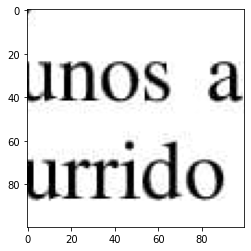

In [ ]:
plt.imshow(X_test[0][:,:,0], cmap='gray')

# MODELO MK01 (FAIL)

In [ ]:
# Train parameters
epochs = 8
batch_size = 256
kernel_size = 4

Model: "encoder_document"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 100, 100, 1)]     0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 100, 100, 32)      544       
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 100, 100, 64)      32832     
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 100, 100, 128)     131200    
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 100, 100, 256)     524544    
Total params: 689,120
Trainable params: 689,120
Non-trainable params: 0
_________________________________________________________________


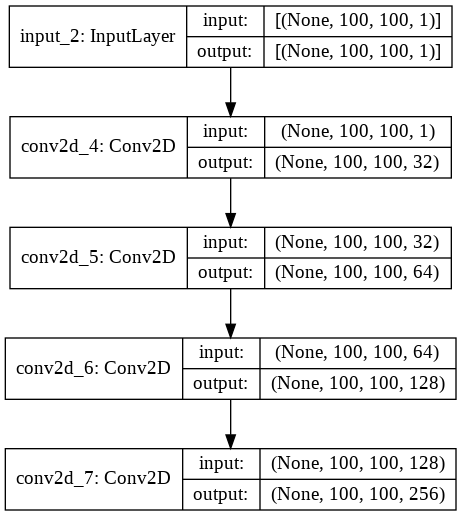

In [ ]:
#Encoder
input_shape = X_train.shape[1:] # (ancho, alto, canales)
layer_filters_encoder = [32, 64, 128, 256]

inputs = Input(shape = input_shape) 

encoder_layers = inputs 

for filters in layer_filters_encoder: 
    encoder_layers = Conv2D(filters = filters, 
               kernel_size = kernel_size, 
               strides = 1, 
               activation ='relu', 
               padding ='same')(encoder_layers) 

encoder_document = Model(inputs, encoder_layers, name ='encoder_document')

encoder_document.summary()
plot_model(encoder_document, to_file='./encoder_document.png',show_shapes=True)

Model: "decoder_colorizing"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
decoder_input (InputLayer)   [(None, 100, 100, 256)]   0         
_________________________________________________________________
conv2d_transpose_3 (Conv2DTr (None, 100, 100, 128)     524416    
_________________________________________________________________
conv2d_transpose_4 (Conv2DTr (None, 100, 100, 64)      131136    
_________________________________________________________________
conv2d_transpose_5 (Conv2DTr (None, 100, 100, 32)      32800     
_________________________________________________________________
decoder_output (Conv2DTransp (None, 100, 100, 1)       513       
Total params: 688,865
Trainable params: 688,865
Non-trainable params: 0
_________________________________________________________________


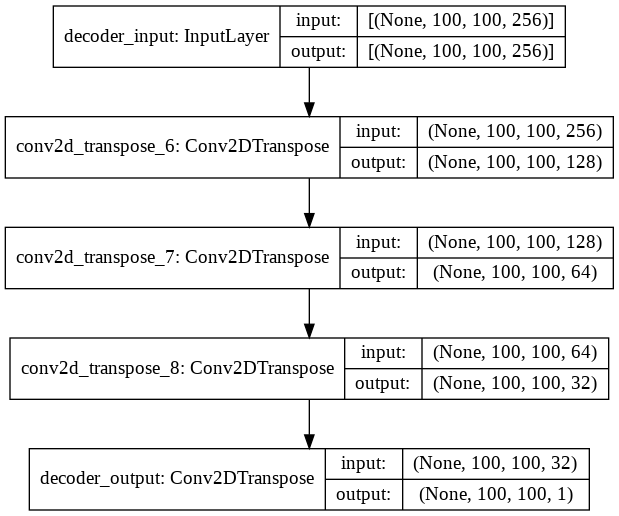

In [ ]:
#Decoder
channels = 1
layer_filters_decoder = [128, 64, 32]

input_decoder = Input(shape =(100,100,256), name ='decoder_input') 
decoder_layers =  input_decoder


decoder_layers = Conv2DTranspose(filters = 128, 
                        kernel_size = kernel_size, 
                        strides = 1, 
                        activation ='relu', 
                        padding ='same')(input_decoder) 

decoder_layers = Conv2DTranspose(filters = 64, 
                        kernel_size = kernel_size, 
                        strides = 1, 
                        activation ='relu', 
                        padding ='same')(decoder_layers) 

decoder_layers = Conv2DTranspose(filters = 32, 
                        kernel_size = kernel_size, 
                        strides = 1, 
                        activation ='relu', 
                        padding ='same')(decoder_layers) 


decoder_layers = Conv2DTranspose(filters = channels , 
                          kernel_size = kernel_size, 
                          activation ='sigmoid', 
                          padding ='same', 
                          name ='decoder_output')(decoder_layers)

decoder_document = Model(input_decoder, decoder_layers, name ='decoder_document')

decoder_colorizing.summary()
plot_model(decoder_document, to_file='./decoder_document.png',show_shapes=True)

Model: "autoencoder_document"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 100, 100, 1)]     0         
_________________________________________________________________
encoder_document (Functional (None, 100, 100, 256)     689120    
_________________________________________________________________
decoder_document (Functional (None, 100, 100, 1)       688865    
Total params: 1,377,985
Trainable params: 1,377,985
Non-trainable params: 0
_________________________________________________________________


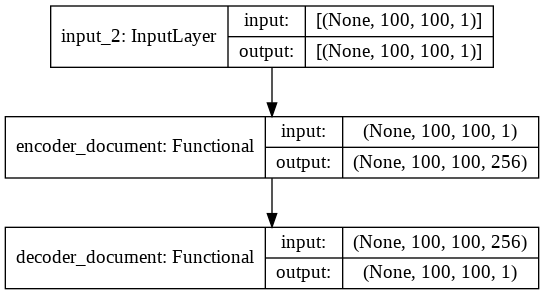

In [ ]:
autoencoder_document = Model(inputs, decoder_document(encoder_document(inputs)), 
                    name ='autoencoder_document')

autoencoder_document.summary()
plot_model(autoencoder_document, to_file='./autoencoder_document.png',show_shapes=True)

Callbacks

In [ ]:
# prepare model saving directory.
save_dir = os.path.join(os.getcwd(), 'saved_models')
model_name = 'colorized_document_model_mk1.{epoch:03d}.h5'
if not os.path.isdir(save_dir):
        os.makedirs(save_dir)
filepath = os.path.join(save_dir, model_name)

# reduce learning rate by sqrt(0.1) if the loss does not improve in 5 epochs
lr_reducer = ReduceLROnPlateau(factor=np.sqrt(0.1),
                               cooldown=0,
                               patience=1,
                               verbose=1,
                               min_lr=0.5e-6)

# save weights for future use (e.g. reload parameters w/o training)
checkpoint = ModelCheckpoint(filepath=filepath,
                             monitor='val_loss',
                             verbose=1,
                             save_best_only=True)


# called every epoch
callbacks = [lr_reducer, checkpoint]

In [ ]:
autoencoder_document.compile(loss= 'mse',
                  optimizer= 'adam',
                   metrics=['mae'])

history=autoencoder_document.fit(X_train,
                X_train,
                validation_data=(X_test, X_test),
                epochs=epochs,
                batch_size=batch_size,
                callbacks=callbacks)

Epoch 1/8
132/132 [==============================] - 460s 3s/step - loss: 0.0787 - mae: 0.1003 - val_loss: 0.0784 - val_mae: 0.0999

Epoch 00001: val_loss improved from inf to 0.07840, saving model to /content/saved_models/colorized_document_model_mk1.001.h5
Epoch 2/8
132/132 [==============================] - 421s 3s/step - loss: 0.0784 - mae: 0.0998 - val_loss: 0.0784 - val_mae: 0.0999

Epoch 00002: ReduceLROnPlateau reducing learning rate to 0.00031622778103685084.

Epoch 00002: val_loss did not improve from 0.07840
Epoch 3/8
132/132 [==============================] - 421s 3s/step - loss: 0.0788 - mae: 0.1004 - val_loss: 0.0784 - val_mae: 0.0999

Epoch 00003: ReduceLROnPlateau reducing learning rate to 0.00010000000639606199.

Epoch 00003: val_loss did not improve from 0.07840
Epoch 4/8
132/132 [==============================] - 421s 3s/step - loss: 0.0786 - mae: 0.1002 - val_loss: 0.0784 - val_mae: 0.0999

Epoch 00004: ReduceLROnPlateau reducing learning rate to 3.1622778103685084e

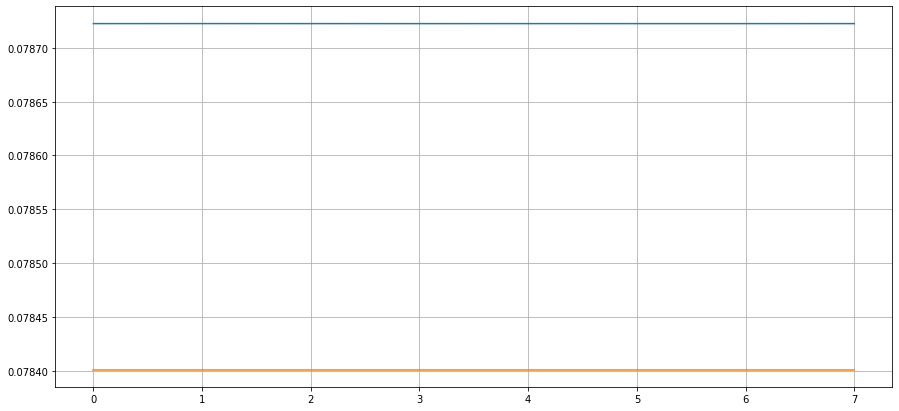

In [ ]:
plt.figure(figsize=(15,7))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.grid()
plt.show()

### Prueba del modelo

In [ ]:
X_restored = autoencoder_document.predict(X_test[0:30])

In [ ]:
number_of_images = 30

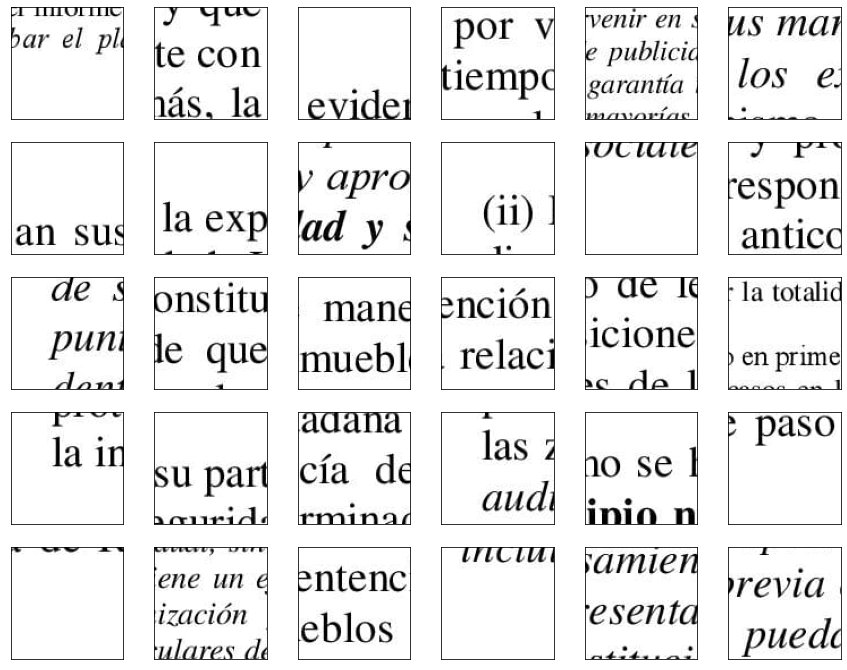

In [ ]:
images = X_train

plt.figure(figsize=(15,12))
for i in range(number_of_images):
    plt.subplot(5,6,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(images[i][:,:,0], cmap='gray')

plt.show()

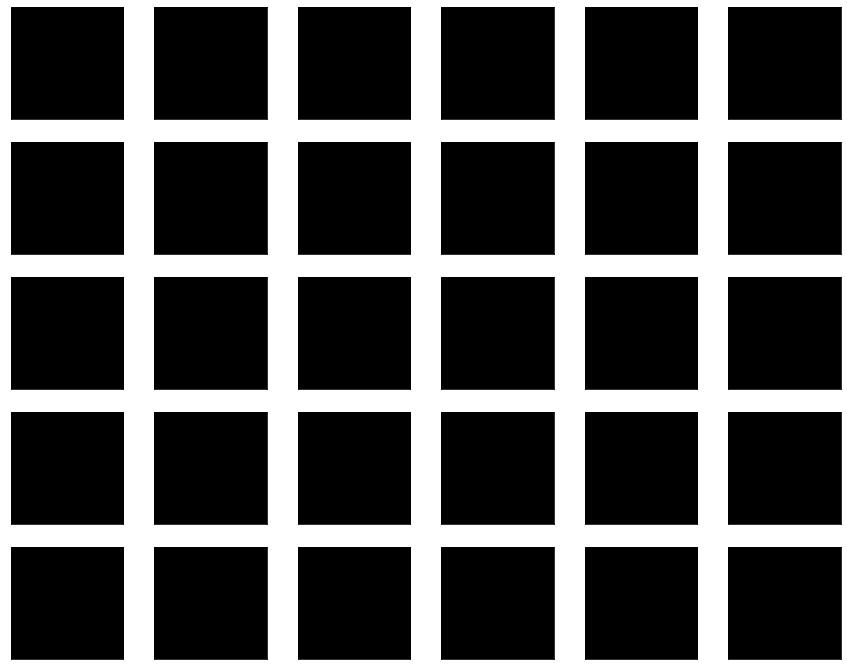

In [ ]:
images = X_restored

plt.figure(figsize=(15,12))
for i in range(number_of_images):
    plt.subplot(5,6,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(images[i][:,:,0], cmap='gray')

plt.show()

# MODELO MK02

In [ ]:
# Train parameters
epochs = 8
batch_size = 256
kernel_size = 3

Model: "encoder_document"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 100, 100, 1)]     0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 100, 100, 64)      640       
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 100, 100, 128)     73856     
_________________________________________________________________
batch_normalization_1 (Batch (None, 100, 100, 128)     512       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 50, 50, 128)       0         
_________________________________________________________________
dropout (Dropout)            (None, 50, 50, 128)       0         
Total params: 75,008
Trainable params: 74,752
Non-trainable params: 256
____________________________________________

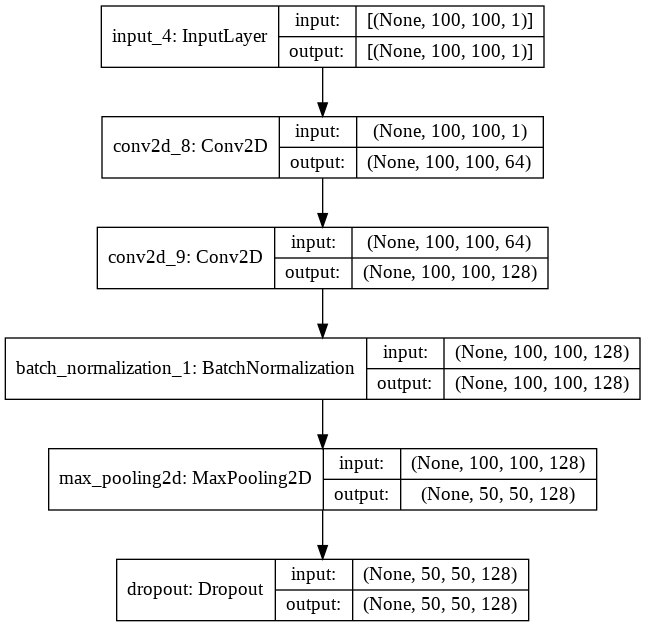

In [ ]:
#Encoder
input_shape = X_train.shape[1:] # (ancho, alto, canales)
layer_filters_encoder = [32, 64, 128, 256]

inputs = Input(shape = input_shape) 
encoder_layers = inputs 

encoder_layers = Conv2D(filters=64,
                        kernel_size=kernel_size,
                        strides = 1, 
                        activation ='relu', 
                        padding ='same')(encoder_layers) 

encoder_layers = Conv2D(filters=128,
                        kernel_size=kernel_size,
                        strides = 1, 
                        activation ='relu', 
                        padding ='same')(encoder_layers) 

encoder_layers = BatchNormalization()(encoder_layers)

encoder_layers = MaxPooling2D((2, 2), padding='same')(encoder_layers)

encoder_layers = Dropout(0.5)(encoder_layers)

encoder_document = Model(inputs, encoder_layers, name ='encoder_document')

encoder_document.summary()
plot_model(encoder_document, to_file='./encoder_document.png',show_shapes=True)

Model: "decoder_document"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
decoder_input (InputLayer)   [(None, 50, 50, 128)]     0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 50, 50, 128)       147584    
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 50, 50, 64)        73792     
_________________________________________________________________
batch_normalization_3 (Batch (None, 50, 50, 64)        256       
_________________________________________________________________
up_sampling2d_1 (UpSampling2 (None, 100, 100, 64)      0         
_________________________________________________________________
decoder_output (Conv2D)      (None, 100, 100, 1)       577       
Total params: 222,209
Trainable params: 222,081
Non-trainable params: 128
__________________________________________

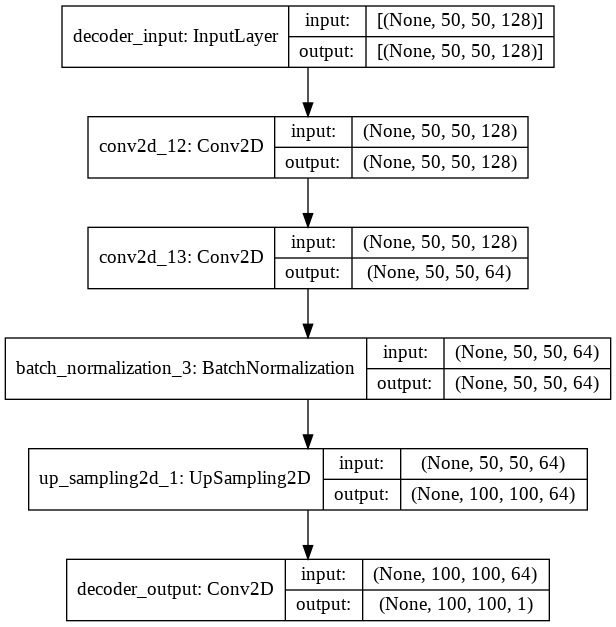

In [ ]:
#Decoder
channels = 1

input_decoder = Input(shape =(50,50,128), name ='decoder_input') 
decoder_layers =  input_decoder


decoder_layers = Conv2D(filters = 128, 
                        kernel_size = kernel_size, 
                        strides = 1, 
                        activation ='relu', 
                        padding ='same')(input_decoder) 

decoder_layers = Conv2D(filters = 64, 
                        kernel_size = kernel_size, 
                        strides = 1, 
                        activation ='relu', 
                        padding ='same')(decoder_layers) 


decoder_layers = BatchNormalization()(decoder_layers)

decoder_layers = UpSampling2D((2, 2))(decoder_layers)

decoder_layers = Conv2D(filters = channels , 
                          kernel_size = kernel_size, 
                          activation ='sigmoid', 
                          padding ='same', 
                          name ='decoder_output')(decoder_layers)

decoder_document = Model(input_decoder, decoder_layers, name ='decoder_document')

decoder_document.summary()
plot_model(decoder_document, to_file='./decoder_document.png',show_shapes=True)

Model: "autoencoder_document"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 100, 100, 1)]     0         
_________________________________________________________________
encoder_document (Functional (None, 50, 50, 128)       75008     
_________________________________________________________________
decoder_document (Functional (None, 100, 100, 1)       222209    
Total params: 297,217
Trainable params: 296,833
Non-trainable params: 384
_________________________________________________________________


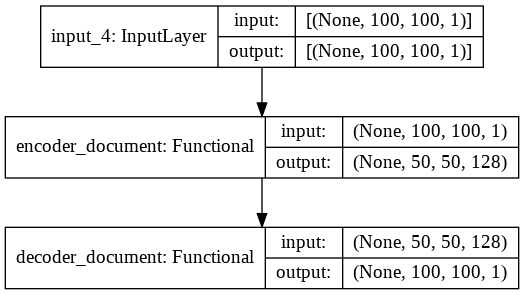

In [ ]:
autoencoder_document = Model(inputs, decoder_document(encoder_document(inputs)), 
                    name ='autoencoder_document')

autoencoder_document.summary()
plot_model(autoencoder_document, to_file='./autoencoder_document.png',show_shapes=True)

Callbacks

In [ ]:
# prepare model saving directory.
save_dir = os.path.join(os.getcwd(), 'saved_models')
model_name = 'colorized_document_model_mk2.{epoch:03d}.h5'
if not os.path.isdir(save_dir):
        os.makedirs(save_dir)
filepath = os.path.join(save_dir, model_name)

# reduce learning rate by sqrt(0.1) if the loss does not improve in 5 epochs
lr_reducer = ReduceLROnPlateau(factor=np.sqrt(0.1),
                               cooldown=0,
                               patience=2,
                               verbose=1,
                               min_lr=0.5e-6)

# save weights for future use (e.g. reload parameters w/o training)
checkpoint = ModelCheckpoint(filepath=filepath,
                             monitor='val_loss',
                             verbose=1,
                             save_best_only=True)


# called every epoch
callbacks = [lr_reducer, checkpoint]

Entrenamiento

In [ ]:
autoencoder_document.compile(loss= 'mse',
                  optimizer= 'adam',
                   metrics=['mae'])

history=autoencoder_document.fit(X_train,
                X_train,
                validation_data=(X_test, X_test),
                epochs=epochs,
                batch_size=batch_size,
                callbacks=callbacks)

Epoch 1/8
132/132 [==============================] - 138s 743ms/step - loss: 0.0402 - mae: 0.1256 - val_loss: 0.0614 - val_mae: 0.1130

Epoch 00001: val_loss improved from inf to 0.06138, saving model to /content/saved_models/colorized_document_model_mk2.001.h5
Epoch 2/8
132/132 [==============================] - 90s 679ms/step - loss: 0.0034 - mae: 0.0367 - val_loss: 0.0463 - val_mae: 0.0844

Epoch 00002: val_loss improved from 0.06138 to 0.04630, saving model to /content/saved_models/colorized_document_model_mk2.002.h5
Epoch 3/8
132/132 [==============================] - 90s 680ms/step - loss: 0.0022 - mae: 0.0276 - val_loss: 0.0373 - val_mae: 0.0754

Epoch 00003: val_loss improved from 0.04630 to 0.03730, saving model to /content/saved_models/colorized_document_model_mk2.003.h5
Epoch 4/8
132/132 [==============================] - 90s 681ms/step - loss: 0.0018 - mae: 0.0244 - val_loss: 0.0225 - val_mae: 0.0609

Epoch 00004: val_loss improved from 0.03730 to 0.02248, saving model to /

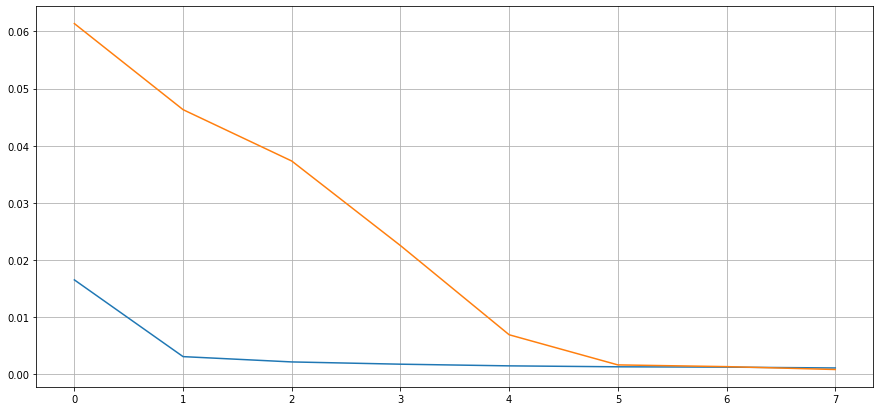

In [ ]:
plt.figure(figsize=(15,7))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.grid()
plt.show()

### Prueba del modelo

In [ ]:
X_restored = autoencoder_document.predict(X_test[0:30])

In [ ]:
number_of_images = 30

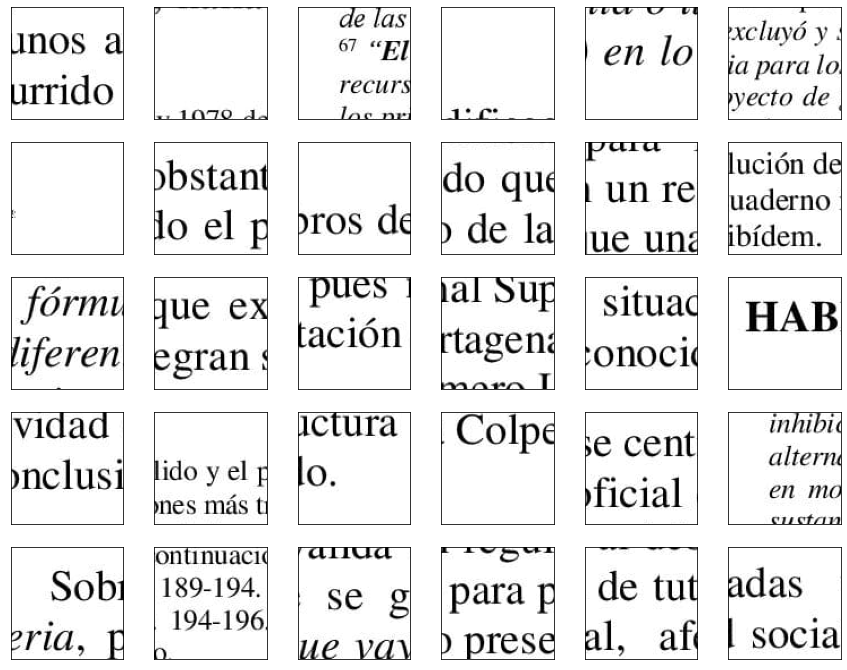

In [ ]:
images = X_test

plt.figure(figsize=(15,12))
for i in range(number_of_images):
    plt.subplot(5,6,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(images[i][:,:,0], cmap='gray')

plt.show()

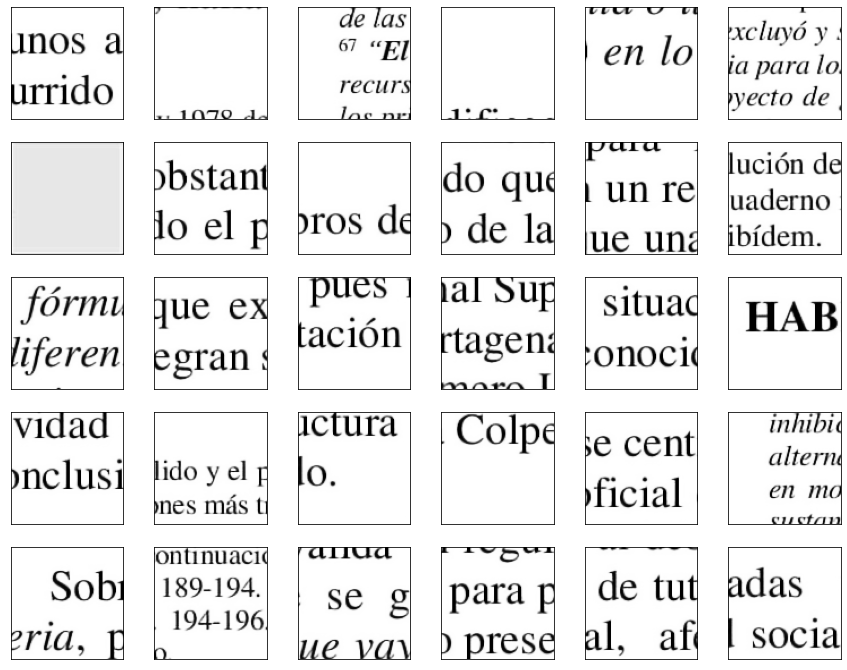

In [ ]:
images = X_restored

plt.figure(figsize=(15,12))
for i in range(number_of_images):
    plt.subplot(5,6,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(images[i][:,:,0], cmap='gray')

plt.show()

Prueba con ruido

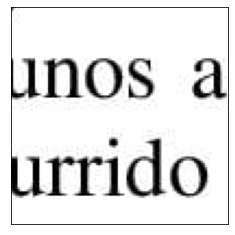

In [ ]:
source_image = X_test[0]
plt.xticks([])
plt.yticks([])
plt.grid(False)
plt.imshow(source_image[:,:,0], cmap='gray')

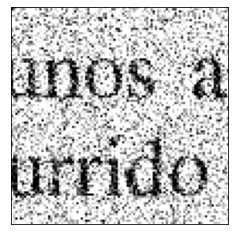

In [ ]:
noise_image = noise(X_test[0],0.4)
plt.xticks([])
plt.yticks([])
plt.grid(False)
plt.imshow(noise_image[:,:,0], cmap='gray')

In [ ]:
noise_image = noise_image.reshape(1,100,100,1)
noise_image_restored = autoencoder_document.predict(noise_image)


In [ ]:
noise_image_restored.shape

(1, 100, 100, 1)

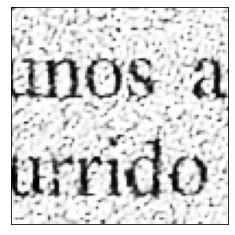

In [ ]:
plt.xticks([])
plt.yticks([])
plt.grid(False)
plt.imshow(noise_image_restored[0,:,:,0], cmap='gray')

In [ ]:
noise_images = noise(X_test[0:30],0.4)

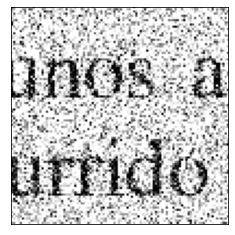

In [ ]:
plt.xticks([])
plt.yticks([])
plt.grid(False)
plt.imshow(noise_images[0][:,:,0], cmap='gray')

# REENTRENAMIENTO DEL MODELO MK02 AÑADIENDO DATOS CON RUIDO ALEATORIO

In [ ]:
def noise(array, noise_value = 0.4):
    """
    Adds random noise to each image in the supplied array.
    """

    noise_factor = noise_value
    noisy_array = array + noise_factor * np.random.normal(
        loc=0.0, scale=1.0, size=array.shape
    )

    return np.clip(noisy_array, 0.0, 1.0)

In [ ]:
X_NOISE = noise(X)

In [ ]:
X_train_noise,X_test_noise=train_test_split(X_NOISE,test_size=0.1, random_state=0)

Liberacion de memoria RAM 

In [ ]:
del X_NOISE
del X

In [ ]:
number_of_images = 30

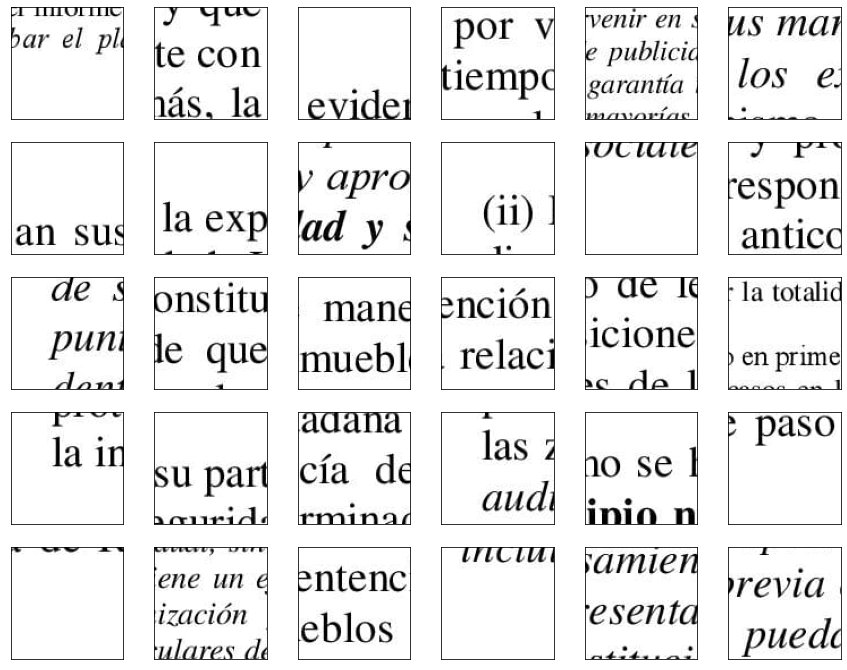

In [ ]:
images = X_train

plt.figure(figsize=(15,12))
for i in range(number_of_images):
    plt.subplot(5,6,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(images[i][:,:,0], cmap='gray')

plt.show()

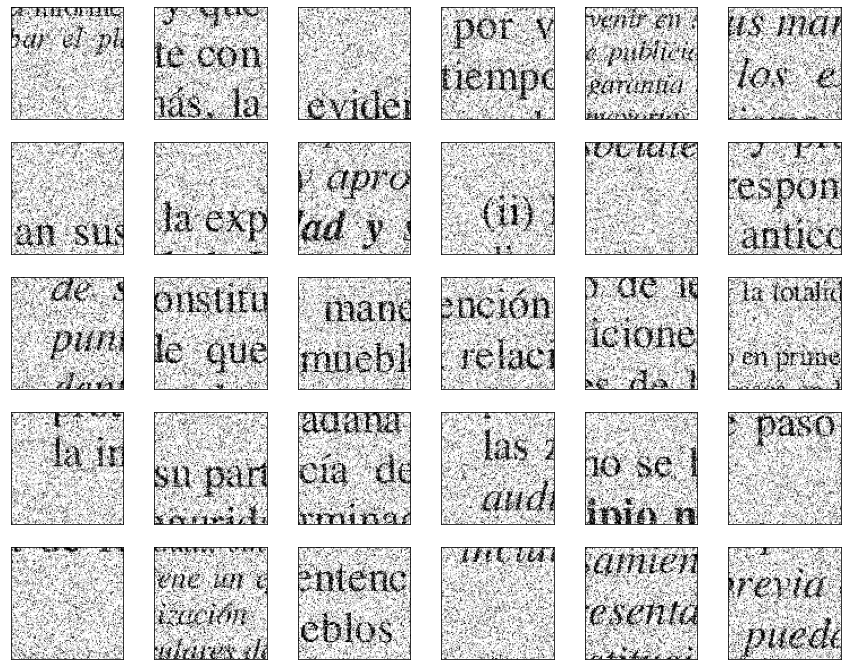

In [ ]:
images = X_train_noise

plt.figure(figsize=(15,12))
for i in range(number_of_images):
    plt.subplot(5,6,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(images[i][:,:,0], cmap='gray')

plt.show()

In [ ]:
from keras.models import load_model
autoencoder_document = load_model('/content/saved_models/colorized_document_model_mk2.008.h5')

Model: "autoencoder_document"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 100, 100, 1)]     0         
_________________________________________________________________
encoder_document (Functional (None, 50, 50, 128)       75008     
_________________________________________________________________
decoder_document (Functional (None, 100, 100, 1)       222209    
Total params: 297,217
Trainable params: 296,833
Non-trainable params: 384
_________________________________________________________________


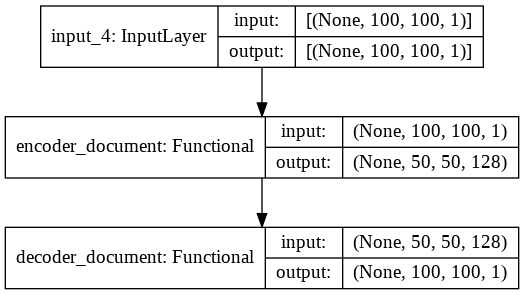

In [ ]:
autoencoder_document.summary()
plot_model(autoencoder_document, to_file='./autoencoder_document.png',show_shapes=True)

In [ ]:
# prepare model saving directory.
save_dir = os.path.join(os.getcwd(), 'saved_models')
model_name = 'colorized_document_model_mk2_retrain.{epoch:03d}.h5'
if not os.path.isdir(save_dir):
        os.makedirs(save_dir)
filepath = os.path.join(save_dir, model_name)

# reduce learning rate by sqrt(0.1) if the loss does not improve in 5 epochs
lr_reducer = ReduceLROnPlateau(factor=np.sqrt(0.1),
                               cooldown=0,
                               patience=2,
                               verbose=1,
                               min_lr=0.5e-6)

# save weights for future use (e.g. reload parameters w/o training)
checkpoint = ModelCheckpoint(filepath=filepath,
                             monitor='val_loss',
                             verbose=1,
                             save_best_only=True)


# called every epoch
callbacks = [lr_reducer, checkpoint]

In [ ]:
epochs = 8
batch_size = 256

history=autoencoder_document.fit(X_train_noise,
                X_train,
                validation_data=(X_test_noise, X_test),
                epochs=epochs,
                batch_size=batch_size,
                callbacks=callbacks)

Epoch 1/8
132/132 [==============================] - 139s 753ms/step - loss: 0.0105 - mae: 0.0435 - val_loss: 0.0084 - val_mae: 0.0354

Epoch 00001: val_loss improved from inf to 0.00841, saving model to /content/saved_models/colorized_document_model_mk2_retrain.001.h5
Epoch 2/8
132/132 [==============================] - 91s 687ms/step - loss: 0.0063 - mae: 0.0327 - val_loss: 0.0061 - val_mae: 0.0382

Epoch 00002: val_loss improved from 0.00841 to 0.00608, saving model to /content/saved_models/colorized_document_model_mk2_retrain.002.h5
Epoch 3/8
132/132 [==============================] - 92s 694ms/step - loss: 0.0058 - mae: 0.0309 - val_loss: 0.0056 - val_mae: 0.0388

Epoch 00003: val_loss improved from 0.00608 to 0.00557, saving model to /content/saved_models/colorized_document_model_mk2_retrain.003.h5
Epoch 4/8
132/132 [==============================] - 92s 694ms/step - loss: 0.0054 - mae: 0.0295 - val_loss: 0.0054 - val_mae: 0.0361

Epoch 00004: val_loss improved from 0.00557 to 0.

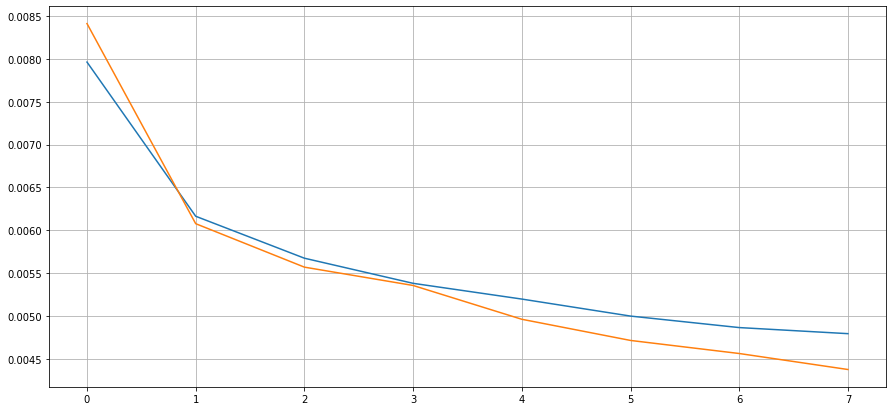

In [ ]:
plt.figure(figsize=(15,7))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.grid()
plt.show()

### Prueba del modelo

In [ ]:
X_restored_clean = autoencoder_document.predict(X_test[0:30])
X_restored_noise = autoencoder_document.predict(X_test_noise[0:30])

In [ ]:
number_of_images = 30

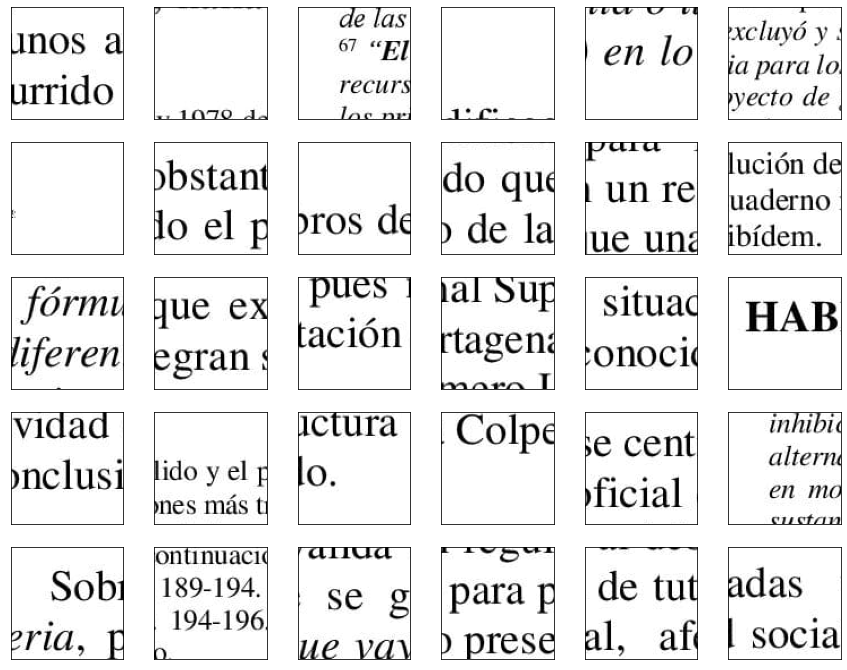

In [ ]:
images = X_test

plt.figure(figsize=(15,12))
for i in range(number_of_images):
    plt.subplot(5,6,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(images[i][:,:,0], cmap='gray')

plt.show()

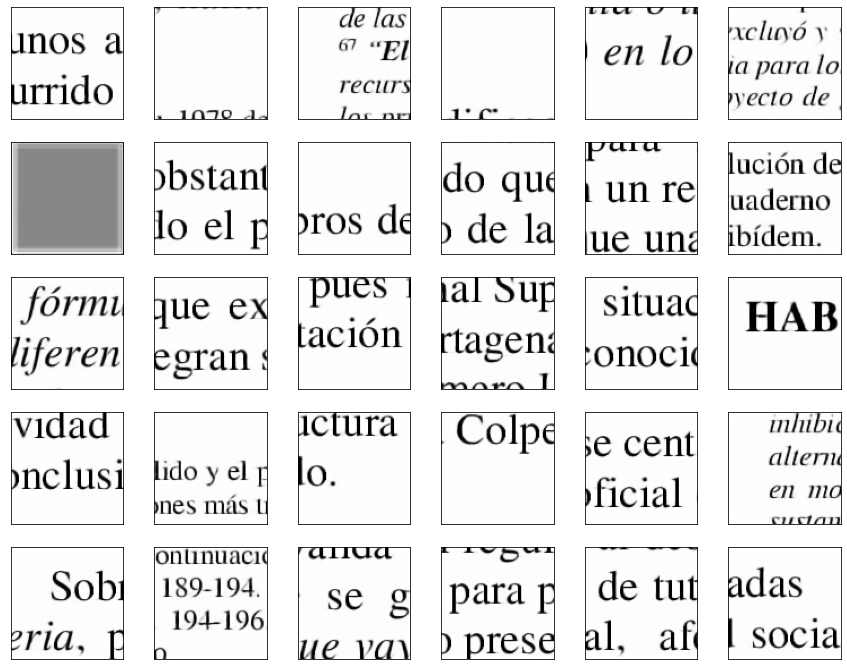

In [ ]:
images = X_restored_clean

plt.figure(figsize=(15,12))
for i in range(number_of_images):
    plt.subplot(5,6,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(images[i][:,:,0], cmap='gray')

plt.show()

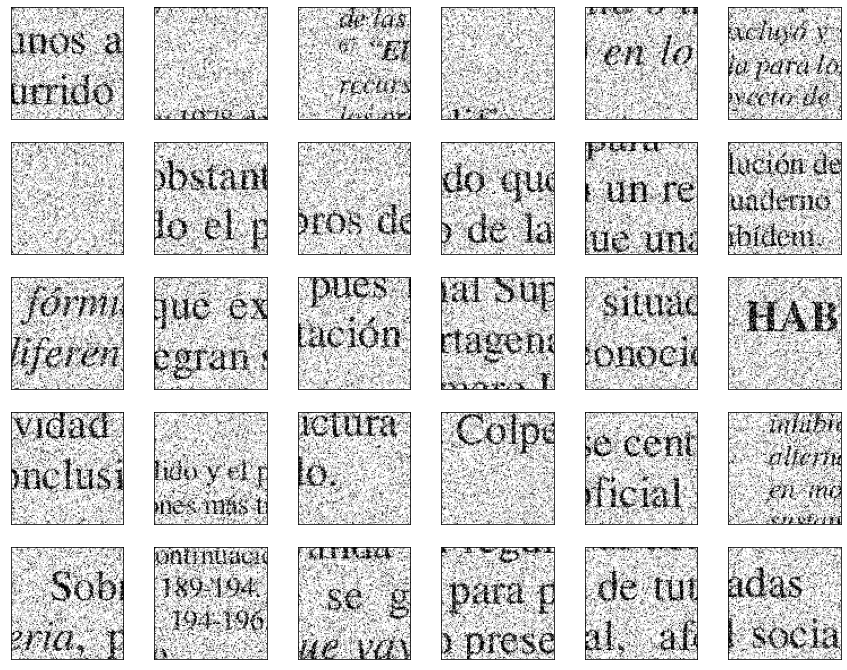

In [ ]:
images = X_test_noise

plt.figure(figsize=(15,12))
for i in range(number_of_images):
    plt.subplot(5,6,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(images[i][:,:,0], cmap='gray')

plt.show()

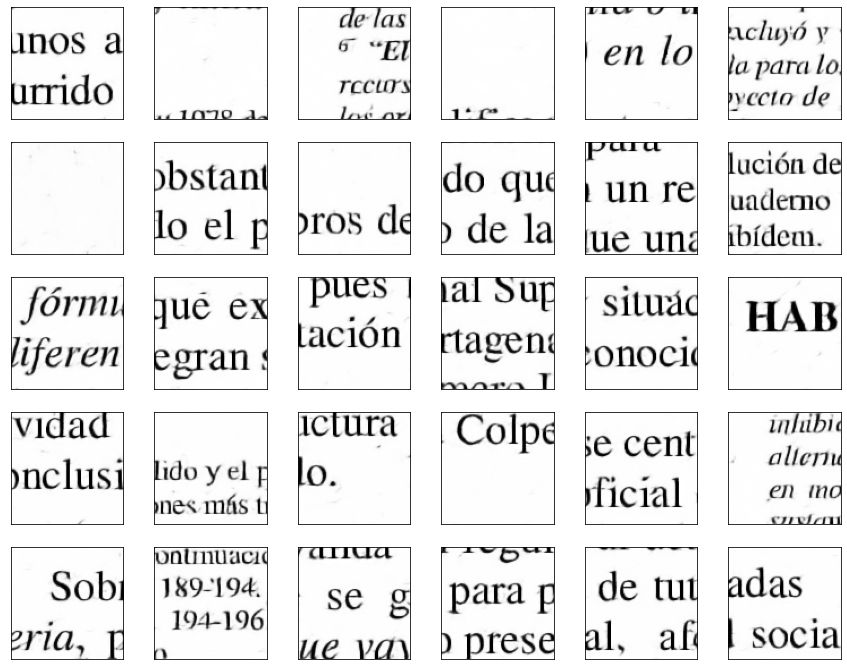

In [ ]:
images = X_restored_noise

plt.figure(figsize=(15,12))
for i in range(number_of_images):
    plt.subplot(5,6,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(images[i][:,:,0], cmap='gray')

plt.show()

# PRUEBA CON ESCANEOS DEL MUNDO REAL

In [ ]:
test_1 = cv2.imread(cv2.samples.findFile("drive/MyDrive/DIPLOMADO INTELIGENCIA ARTIFICIAL/TAREAS/9. RETOS/2. Restauracion de documentos/DATA/TEST/REAL_TEST_01.jpg"))
test_1.shape

(3400, 2400, 3)

In [ ]:
test_2 = cv2.imread(cv2.samples.findFile("drive/MyDrive/DIPLOMADO INTELIGENCIA ARTIFICIAL/TAREAS/9. RETOS/2. Restauracion de documentos/DATA/TEST/REAL_TEST_02.png"))
test_2.shape

(900, 1300, 3)

In [ ]:
test_3 = cv2.imread(cv2.samples.findFile("drive/MyDrive/DIPLOMADO INTELIGENCIA ARTIFICIAL/TAREAS/9. RETOS/2. Restauracion de documentos/DATA/TEST/REAL_TEST_03.png"))
test_3.shape

(2500, 3200, 3)

In [ ]:
def clean_document(image, model):
  # Funcion para limpiar documentos importados como imagenes
  # Se recomuenda que la resolucion del documento creado sea multiplo de 100
  image_size = image.shape
  output = np.zeros(image_size)

  for i in range(0,image_size[1],100):
    for j in range(0,image_size[0],100):

      image_sample = image[j:j+100,i:i+100]

      if image_sample.shape == (100, 100, 3) and np.mean(image_sample)!=255:

        image_sample_numpy = image_sample[:,:,0].reshape((100,100,1))
        x = image_sample_numpy.astype('float32') / 255.
        x = x.reshape(1,100,100,1)
        y = autoencoder_document.predict(x)
        output[j:j+100,i:i+100] = y

      else:
        output[j:j+100,i:i+100] = 1

  output = output * 255
  output = output.astype('uint8')

  return output

###TEST 1 

In [ ]:
test_1_restored = clean_document(test_1,autoencoder_document)

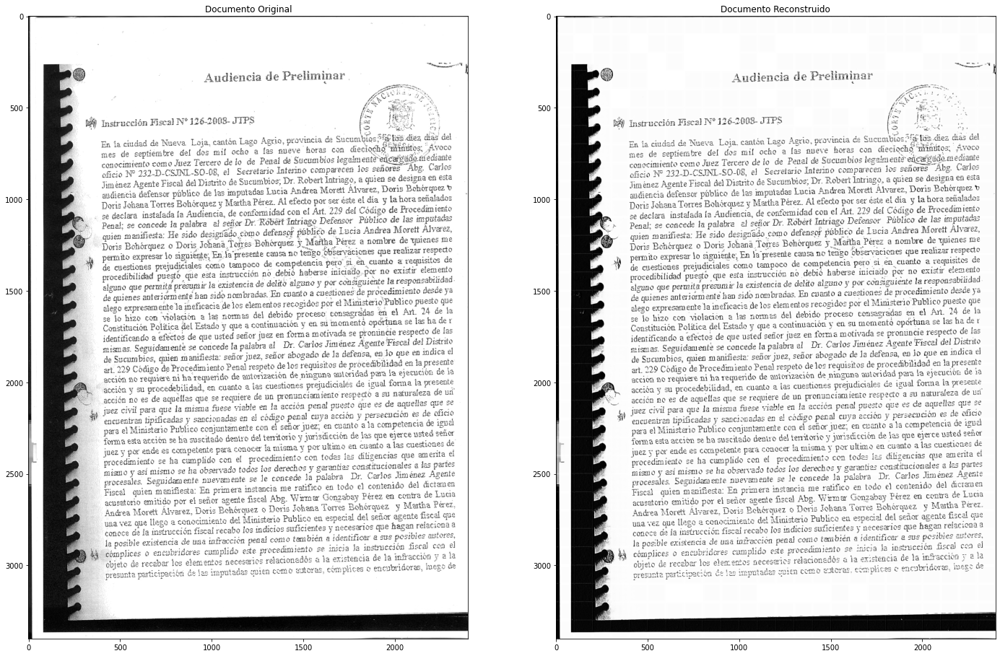

In [ ]:
plt.figure(figsize=(24,20))

plt.subplot(1,2,1)
plt.xticks([])
plt.yticks([])
plt.grid(False)
ax = plt.subplot("121")
ax.set_title("Documento Original")
plt.imshow(test_1[:,:,0], cmap='gray')


plt.subplot(1,2,2)
plt.xticks([])
plt.yticks([])
plt.grid(False)
ax = plt.subplot("122")
ax.set_title("Documento Reconstruido")
plt.imshow(test_1_restored[:,:,0], cmap='gray')

plt.show()

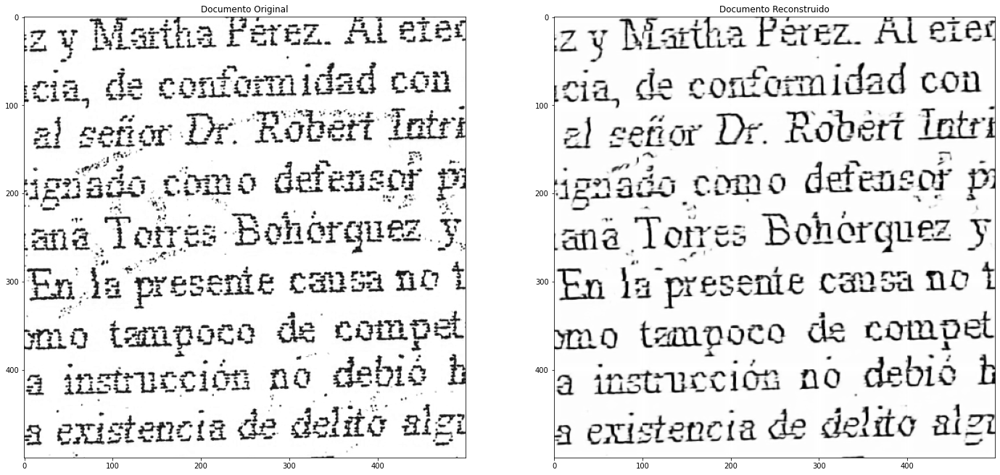

In [ ]:
x = 1000
y = 1000
window = 500

plt.figure(figsize=(24,20))

plt.subplot(1,2,1)
plt.xticks([])
plt.yticks([])
plt.grid(False)
ax = plt.subplot("121")
ax.set_title("Documento Original")
plt.imshow(test_1[y:y+window,x:x+window,0], cmap='gray')


plt.subplot(1,2,2)
plt.xticks([])
plt.yticks([])
plt.grid(False)
ax = plt.subplot("122")
ax.set_title("Documento Reconstruido")
plt.imshow(test_1_restored[y:y+window,x:x+window,0], cmap='gray')

plt.show()

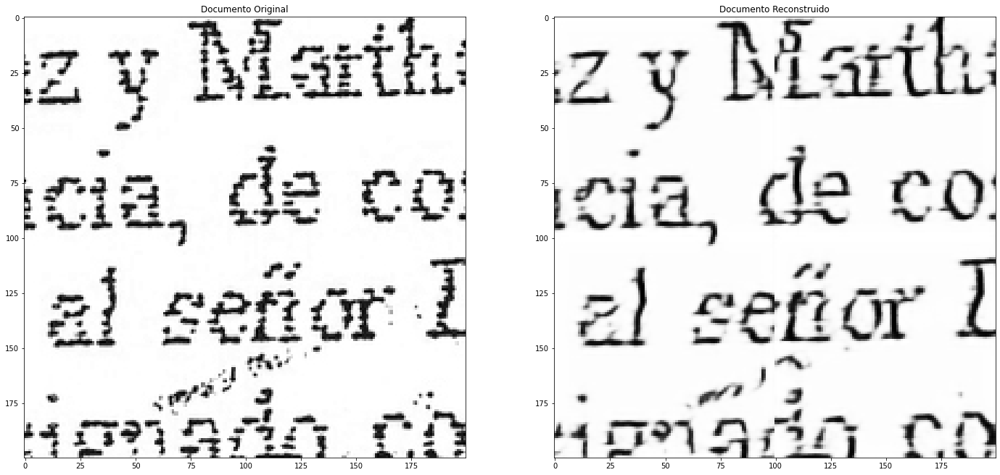

In [ ]:
x = 1000
y = 1000
window = 200

plt.figure(figsize=(24,20))

plt.subplot(1,2,1)
plt.xticks([])
plt.yticks([])
plt.grid(False)
ax = plt.subplot("121")
ax.set_title("Documento Original")
plt.imshow(test_1[y:y+window,x:x+window,0], cmap='gray')


plt.subplot(1,2,2)
plt.xticks([])
plt.yticks([])
plt.grid(False)
ax = plt.subplot("122")
ax.set_title("Documento Reconstruido")
plt.imshow(test_1_restored[y:y+window,x:x+window,0], cmap='gray')

plt.show()

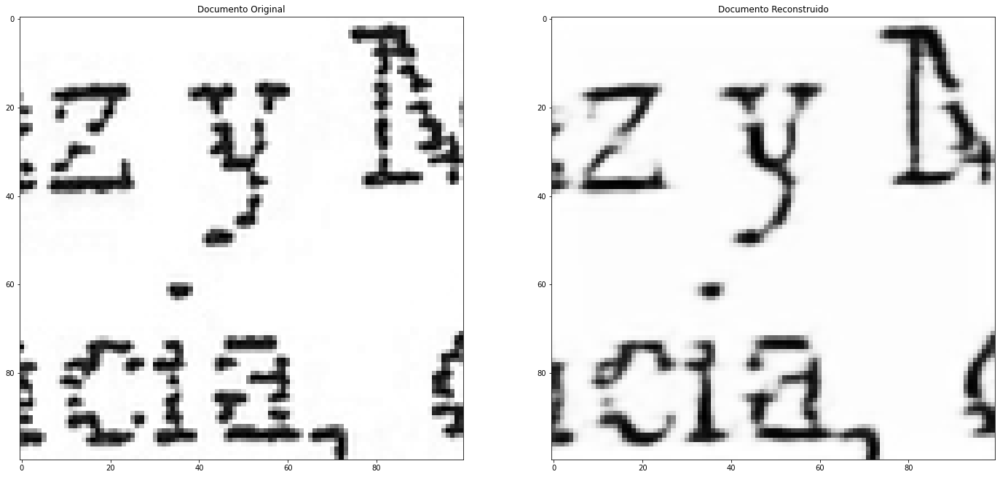

In [ ]:
x = 1000
y = 1000
window = 100

plt.figure(figsize=(24,20))

plt.subplot(1,2,1)
plt.xticks([])
plt.yticks([])
plt.grid(False)
ax = plt.subplot("121")
ax.set_title("Documento Original")
plt.imshow(test_1[y:y+window,x:x+window,0], cmap='gray')


plt.subplot(1,2,2)
plt.xticks([])
plt.yticks([])
plt.grid(False)
ax = plt.subplot("122")
ax.set_title("Documento Reconstruido")
plt.imshow(test_1_restored[y:y+window,x:x+window,0], cmap='gray')

plt.show()

### TEST 2

In [ ]:
test_2_restored = clean_document(test_2,autoencoder_document)

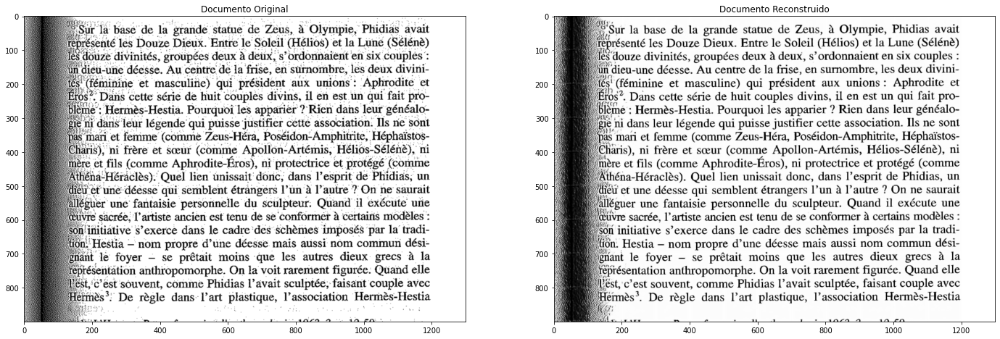

In [ ]:
plt.figure(figsize=(24,20))

plt.subplot(1,2,1)
plt.xticks([])
plt.yticks([])
plt.grid(False)
ax = plt.subplot("121")
ax.set_title("Documento Original")
plt.imshow(test_2[:,:,0], cmap='gray')


plt.subplot(1,2,2)
plt.xticks([])
plt.yticks([])
plt.grid(False)
ax = plt.subplot("122")
ax.set_title("Documento Reconstruido")
plt.imshow(test_2_restored[:,:,0], cmap='gray')

plt.show()

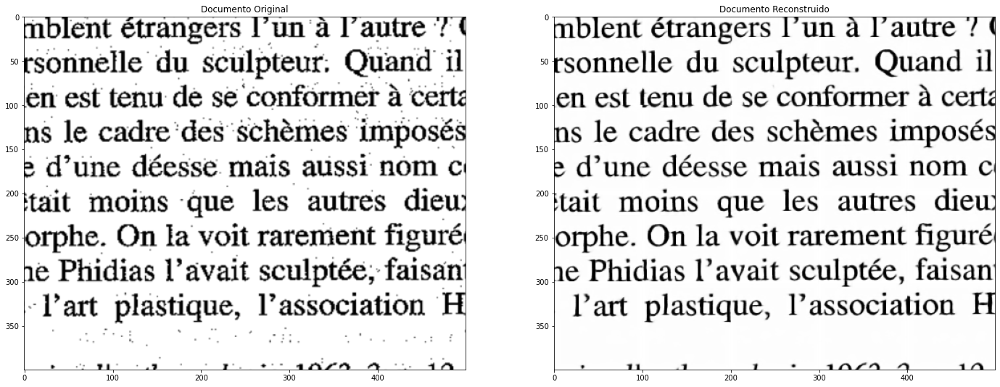

In [ ]:
x = 500
y = 500
window = 500

plt.figure(figsize=(24,20))

plt.subplot(1,2,1)
plt.xticks([])
plt.yticks([])
plt.grid(False)
ax = plt.subplot("121")
ax.set_title("Documento Original")
plt.imshow(test_2[y:y+window,x:x+window,0], cmap='gray')


plt.subplot(1,2,2)
plt.xticks([])
plt.yticks([])
plt.grid(False)
ax = plt.subplot("122")
ax.set_title("Documento Reconstruido")
plt.imshow(test_2_restored[y:y+window,x:x+window,0], cmap='gray')

plt.show()

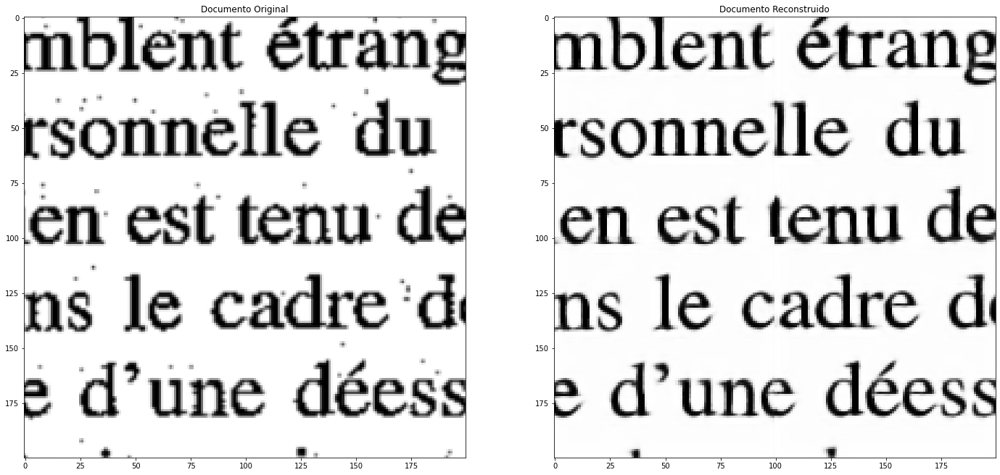

In [ ]:
x = 500
y = 500
window = 200

plt.figure(figsize=(24,20))

plt.subplot(1,2,1)
plt.xticks([])
plt.yticks([])
plt.grid(False)
ax = plt.subplot("121")
ax.set_title("Documento Original")
plt.imshow(test_2[y:y+window,x:x+window,0], cmap='gray')


plt.subplot(1,2,2)
plt.xticks([])
plt.yticks([])
plt.grid(False)
ax = plt.subplot("122")
ax.set_title("Documento Reconstruido")
plt.imshow(test_2_restored[y:y+window,x:x+window,0], cmap='gray')

plt.show()

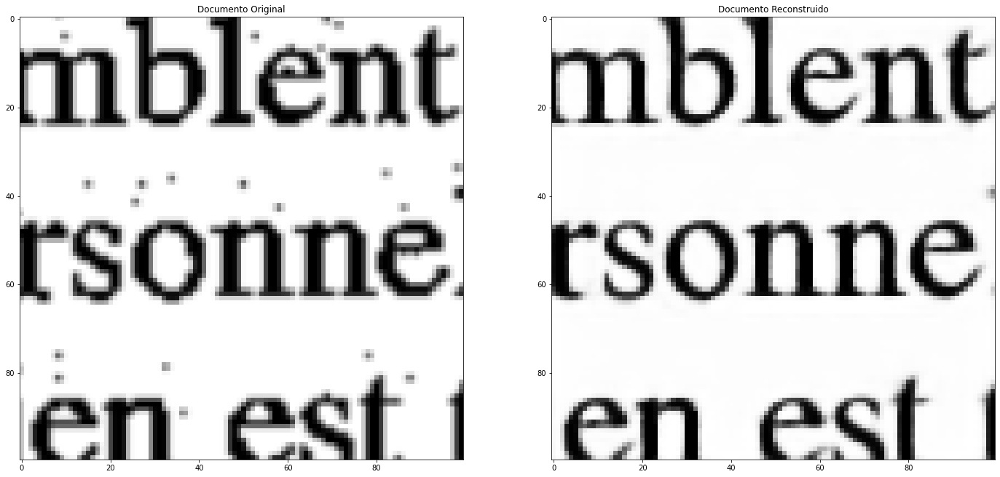

In [ ]:
x = 500
y = 500
window = 100

plt.figure(figsize=(24,20))

plt.subplot(1,2,1)
plt.xticks([])
plt.yticks([])
plt.grid(False)
ax = plt.subplot("121")
ax.set_title("Documento Original")
plt.imshow(test_2[y:y+window,x:x+window,0], cmap='gray')


plt.subplot(1,2,2)
plt.xticks([])
plt.yticks([])
plt.grid(False)
ax = plt.subplot("122")
ax.set_title("Documento Reconstruido")
plt.imshow(test_2_restored[y:y+window,x:x+window,0], cmap='gray')

plt.show()

### TEST 3

In [ ]:
test_3_restored = clean_document(test_3,autoencoder_document)

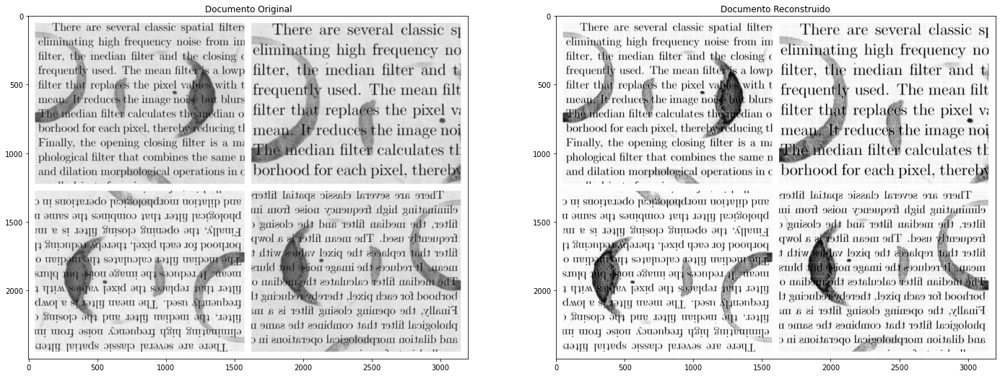

In [ ]:
plt.figure(figsize=(24,20))

plt.subplot(1,2,1)
plt.xticks([])
plt.yticks([])
plt.grid(False)
ax = plt.subplot("121")
ax.set_title("Documento Original")
plt.imshow(test_3[:,:,0], cmap='gray')


plt.subplot(1,2,2)
plt.xticks([])
plt.yticks([])
plt.grid(False)
ax = plt.subplot("122")
ax.set_title("Documento Reconstruido")
plt.imshow(test_3_restored[:,:,0], cmap='gray')

plt.show()

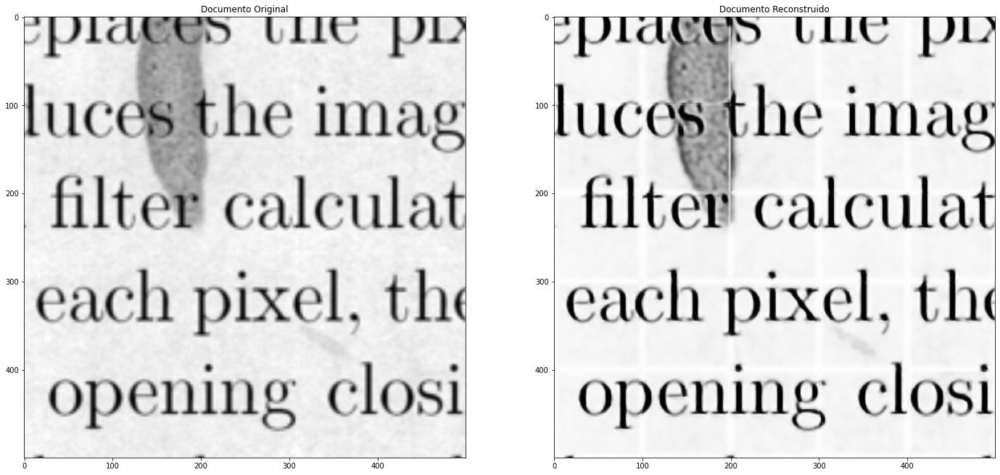

In [ ]:
x = 500
y = 500
window = 500

plt.figure(figsize=(24,20))

plt.subplot(1,2,1)
plt.xticks([])
plt.yticks([])
plt.grid(False)
ax = plt.subplot("121")
ax.set_title("Documento Original")
plt.imshow(test_3[y:y+window,x:x+window,0], cmap='gray')


plt.subplot(1,2,2)
plt.xticks([])
plt.yticks([])
plt.grid(False)
ax = plt.subplot("122")
ax.set_title("Documento Reconstruido")
plt.imshow(test_3_restored[y:y+window,x:x+window,0], cmap='gray')

plt.show()

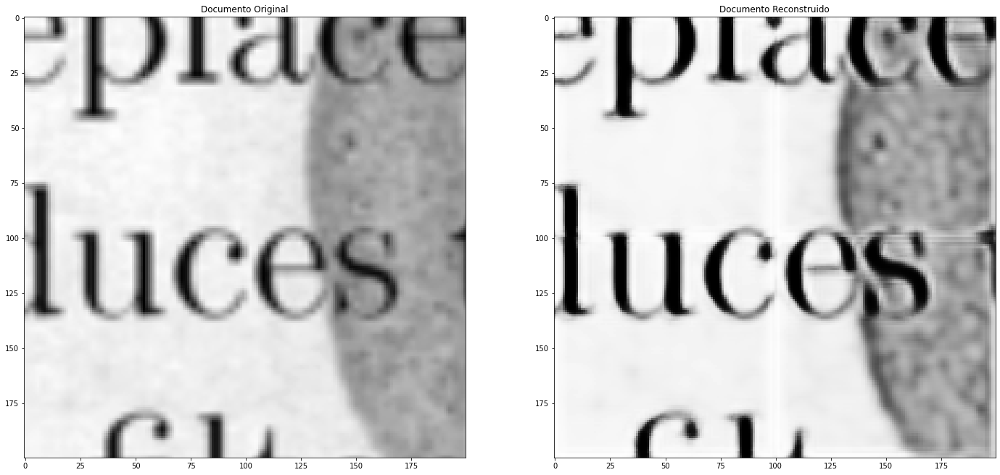

In [ ]:
x = 500
y = 500
window = 200

plt.figure(figsize=(24,20))

plt.subplot(1,2,1)
plt.xticks([])
plt.yticks([])
plt.grid(False)
ax = plt.subplot("121")
ax.set_title("Documento Original")
plt.imshow(test_3[y:y+window,x:x+window,0], cmap='gray')


plt.subplot(1,2,2)
plt.xticks([])
plt.yticks([])
plt.grid(False)
ax = plt.subplot("122")
ax.set_title("Documento Reconstruido")
plt.imshow(test_3_restored[y:y+window,x:x+window,0], cmap='gray')

plt.show()

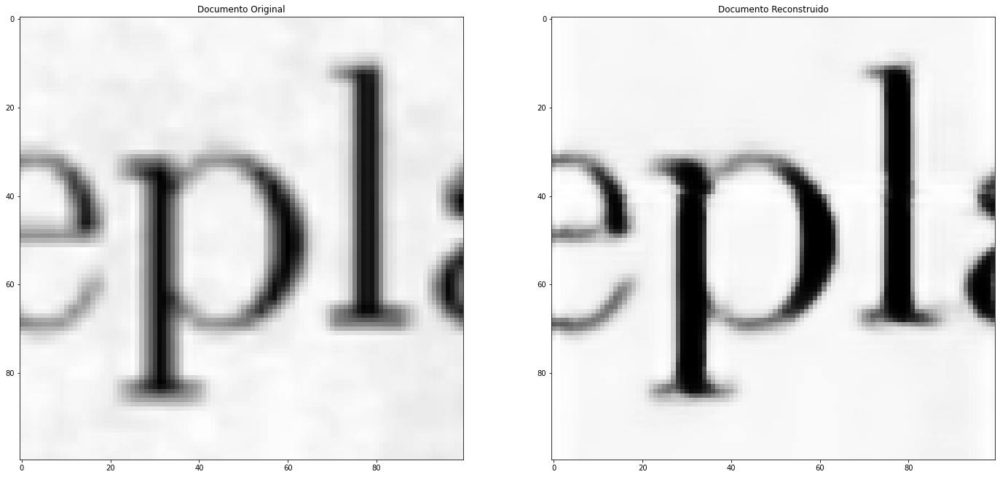

In [ ]:
x = 500
y = 460
window = 100

plt.figure(figsize=(24,20))

plt.subplot(1,2,1)
plt.xticks([])
plt.yticks([])
plt.grid(False)
ax = plt.subplot("121")
ax.set_title("Documento Original")
plt.imshow(test_3[y:y+window,x:x+window,0], cmap='gray')


plt.subplot(1,2,2)
plt.xticks([])
plt.yticks([])
plt.grid(False)
ax = plt.subplot("122")
ax.set_title("Documento Reconstruido")
plt.imshow(test_3_restored[y:y+window,x:x+window,0], cmap='gray')

plt.show()